In [1]:
import math
import numpy as np
import pandas as pd
import cv2
import time
import matplotlib.pyplot as plt

In [2]:
class Pixel(object):
    def __init__(self, x, y, value):
        self.x = x
        self.y = y
        self.value = value

class Haze2remove:
    
    def __init__(self, src, patch = 15, percent = 0.001, omega = 0.95, t0 = 0.1):
        self.src = "images/" + src
        self.img = cv2.imread(self.src)
        self.patch = patch
        self.percent = percent
        self.omega = omega
        self.t0 = t0
        
    def MinChannel(self):
        
        self.MinChannel = np.min(self.img, axis=2)

        return self.MinChannel

    def DarkChannel(self):

        Patch = int((self.patch-1)/2)
        H = self.img.shape[0] + self.patch - 1
        W = self.img.shape[1] + self.patch - 1

        imgMiddle = 255 * np.ones((H,W))    
        imgMiddle[Patch:H-Patch, Patch:W-Patch] = self.MinChannel

        self.DarkChannel = np.zeros_like(self.MinChannel, np.uint8)    

        for i in range(Patch, H-Patch):
            for j in range(Patch, W-Patch):
                x = range(i-Patch, i+Patch+1)
                y = range(j-Patch, j+Patch+1)
                self.DarkChannel[i-Patch,j-Patch] = np.min(imgMiddle[i-Patch:i+Patch, j-Patch:j+Patch])                            

        return self.DarkChannel

    def AtomsphericLight(self):

        size = self.DarkChannel.shape[0] * self.DarkChannel.shape[1]
        height = self.DarkChannel.shape[0]
        width = self.DarkChannel.shape[1]

        pixels = []

        for i in range(0,height):
            for j in range(0,width):
                pixel = Pixel(i,j,self.DarkChannel[i,j])
                pixels.append(pixel)

        pixels = sorted(pixels, key = lambda pixel: pixel.value, reverse = True)

        self.AtomsphericLight = [0, 0, 0]

        if int(self.percent * size) == 0:
            for i in range(0,3):
                if self.img[pixels[0].x,pixels[0].y,i] > self.AtomsphericLight[i]:
                    self.AtomsphericLight[i] = self.img[pixels[0].x,pixels[0].y,i]
            return self.AtomsphericLight
        
        for i in range(0,int(self.percent * size)):
            for j in range(0,3):
                if self.img[pixels[i].x, pixels[i].y, j] > self.AtomsphericLight[j]:
                    self.AtomsphericLight[j] = self.img[pixels[i].x, pixels[i].y, j]
            return self.AtomsphericLight

    def go(self):

        self.MinChannel = self.MinChannel()
        self.DarkChannel = self.DarkChannel()
        self.AtomsphericLight = self.AtomsphericLight()

        Dark = np.float64(self.DarkChannel)
        self.Transmission = 1 - self.omega * Dark / np.min(self.AtomsphericLight)
        self.Transmission[self.Transmission < self.t0] = self.t0     

        self.SceneRadiance = np.zeros(self.img.shape)
        img = np.float64(self.img)
        
        for i in range(3):        
            SR = (img[:,:,i] - self.AtomsphericLight[i])/self.Transmission + self.AtomsphericLight[i]               
            SR[SR>255] = 255
            SR[SR<0] = 0                    
            self.SceneRadiance[:,:,i] = SR  

        self.SceneRadiance = np.uint8(self.SceneRadiance)
    
    
    def show(self):
        plt.figure(figsize = (20,15))
        
        plt.subplot(221)
        plt.title(r'Before')
        plt.imshow(cv2.cvtColor(self.img, cv2.COLOR_BGR2RGB))
        
        plt.subplot(222)
        plt.title(r'After')
        plt.imshow(cv2.cvtColor(self.SceneRadiance, cv2.COLOR_BGR2RGB))
        
        plt.subplot(223)
        plt.title(r'Dark Channel')
        plt.imshow(self.DarkChannel, cmap = 'gray')
        
        plt.subplot(224)
        plt.title(r'Transmission (depth)')
        plt.imshow(self.Transmission)

CPU times: user 17 s, sys: 788 ms, total: 17.8 s
Wall time: 15.9 s


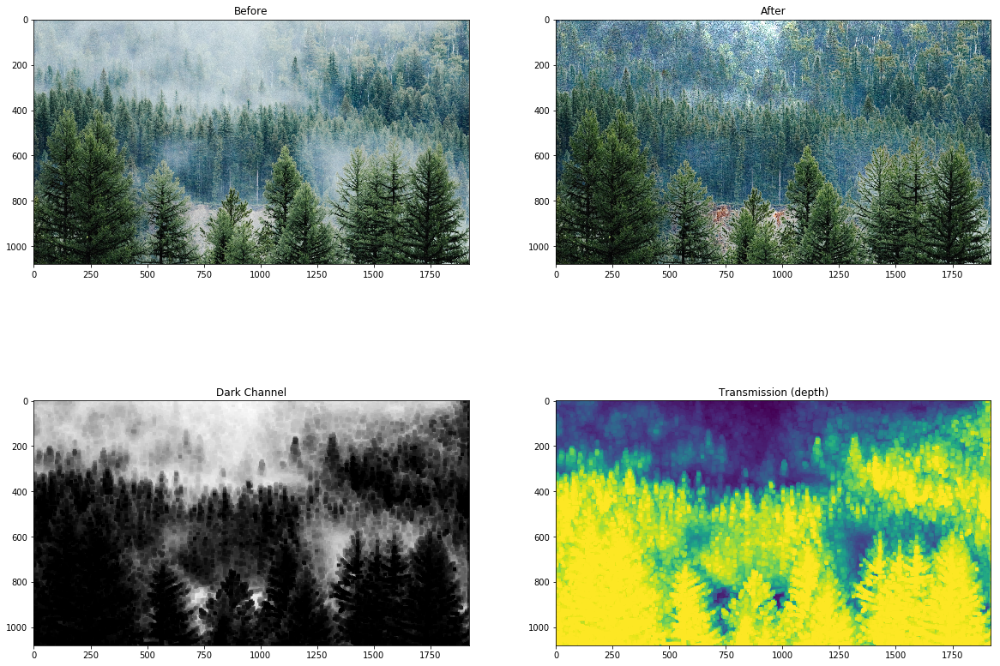

In [3]:
%%time
img1 = Haze2remove("1.jpg", patch=15)
img1.go()
img1.show()

CPU times: user 2.85 s, sys: 182 ms, total: 3.03 s
Wall time: 2.14 s


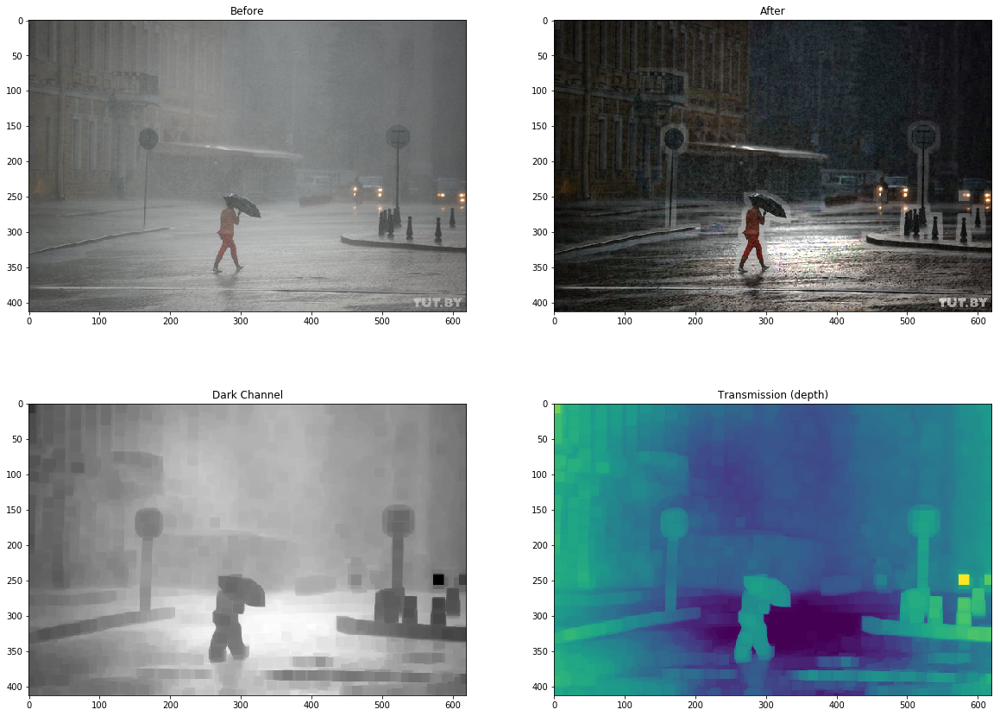

In [4]:
%%time
img2 = Haze2remove("2.jpg")
img2.go()
img2.show()

CPU times: user 9.39 s, sys: 265 ms, total: 9.65 s
Wall time: 8.45 s


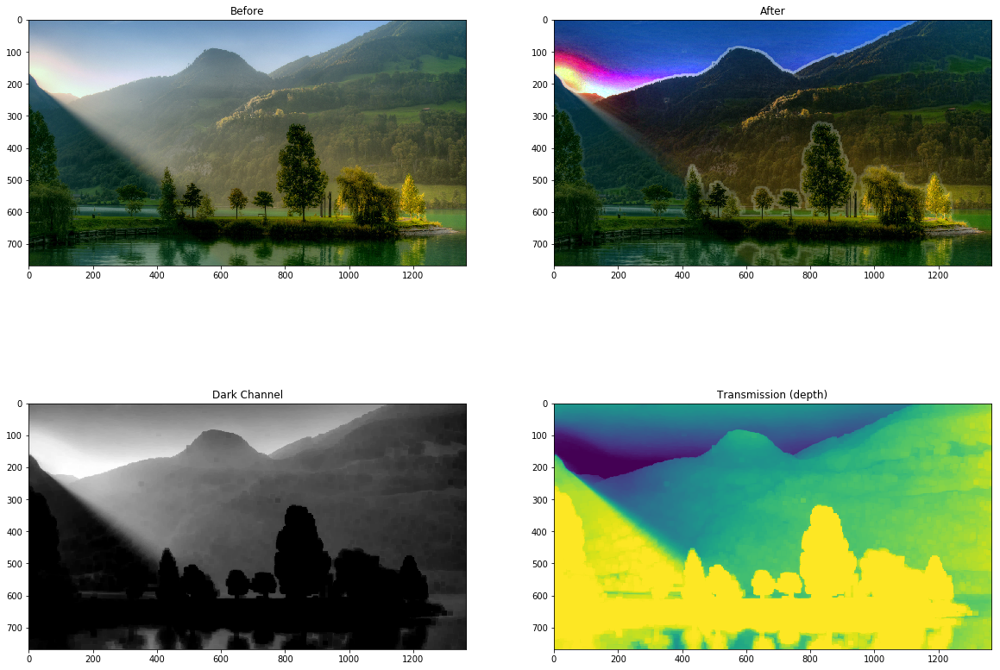

In [5]:
%%time
img3 = Haze2remove("3.jpg")
img3.go()
img3.show()

CPU times: user 4.01 s, sys: 170 ms, total: 4.18 s
Wall time: 3.27 s


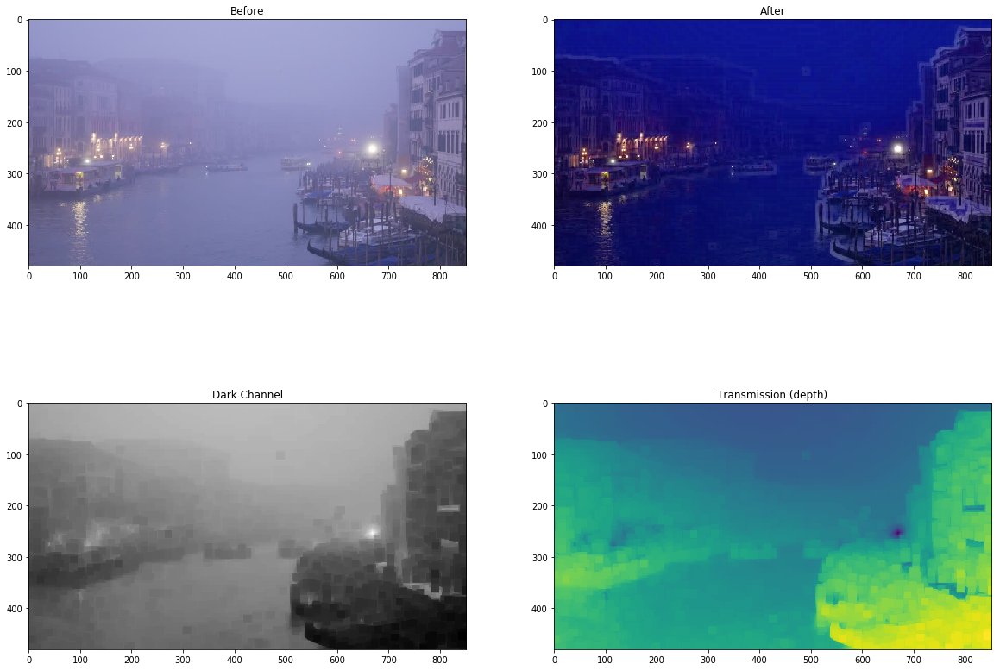

In [6]:
%%time
img4 = Haze2remove("4.jpg")
img4.go()
img4.show()

CPU times: user 3.65 s, sys: 115 ms, total: 3.76 s
Wall time: 2.86 s


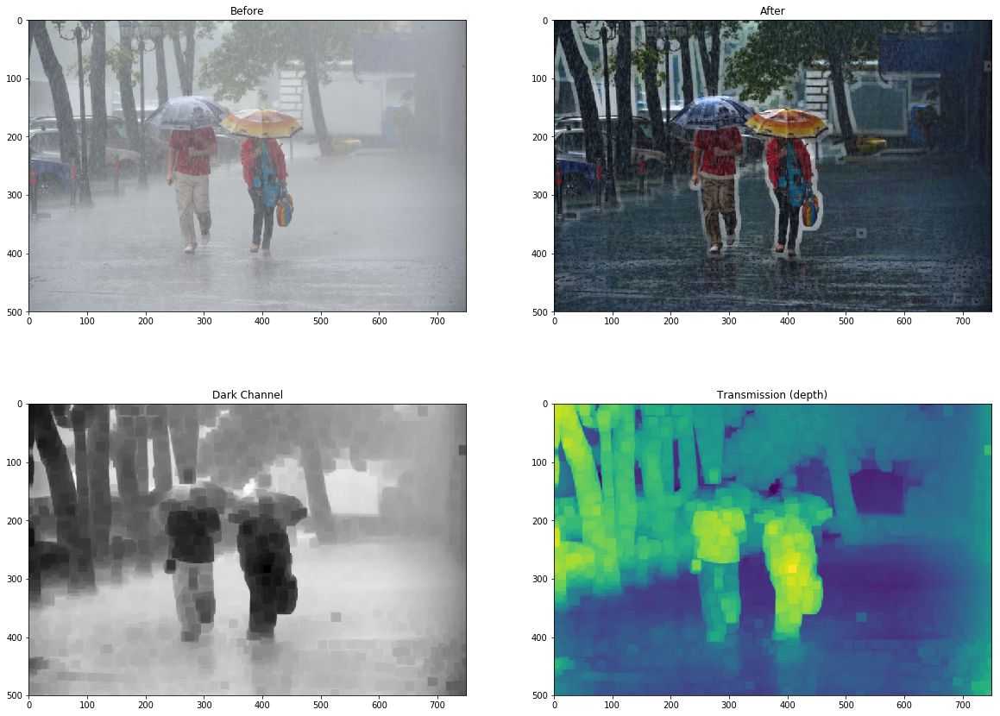

In [7]:
%%time
img5 = Haze2remove("5.jpg", patch = 15)
img5.go()
img5.show()

CPU times: user 4.13 s, sys: 248 ms, total: 4.38 s
Wall time: 3.37 s


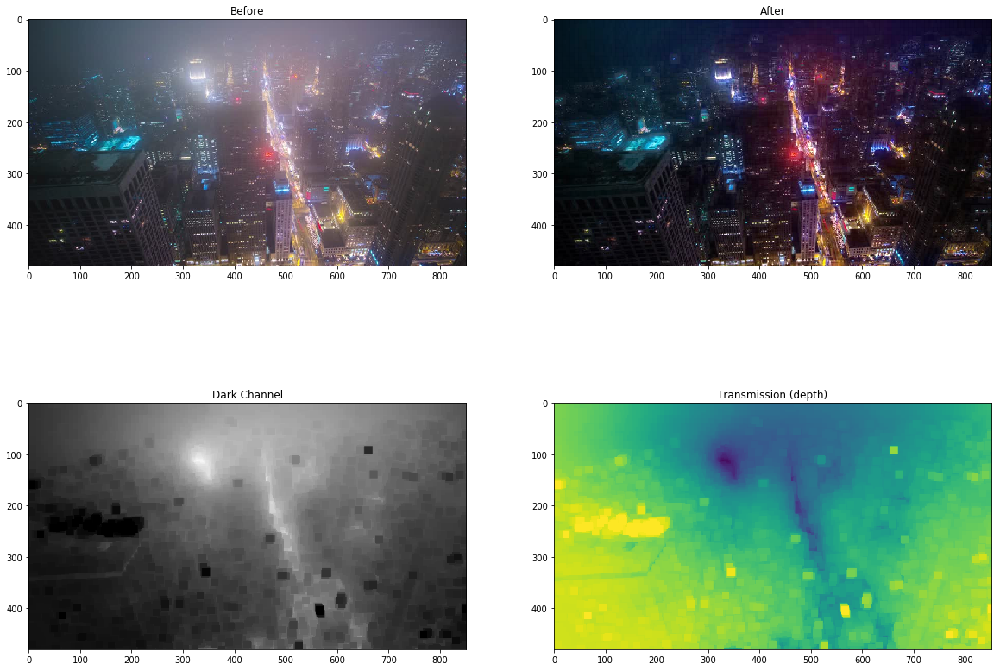

In [8]:
%%time
img6 = Haze2remove("6.jpg")
img6.go()
img6.show()

CPU times: user 5.18 s, sys: 248 ms, total: 5.43 s
Wall time: 4.35 s


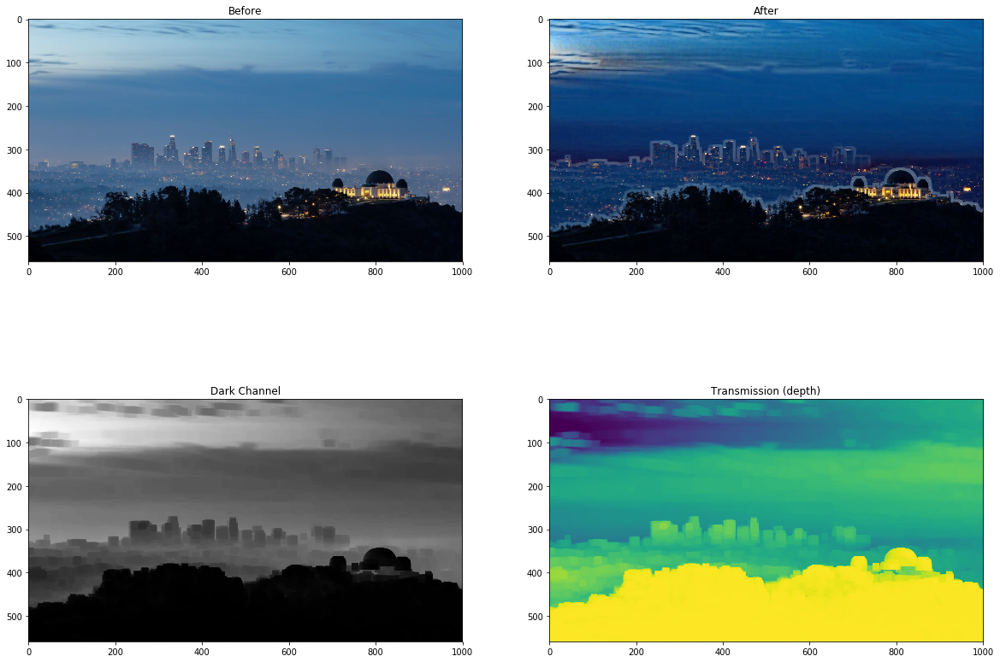

In [9]:
%%time
img7 = Haze2remove("7.jpg")
img7.go()
img7.show()

CPU times: user 11.1 s, sys: 429 ms, total: 11.5 s
Wall time: 10.1 s


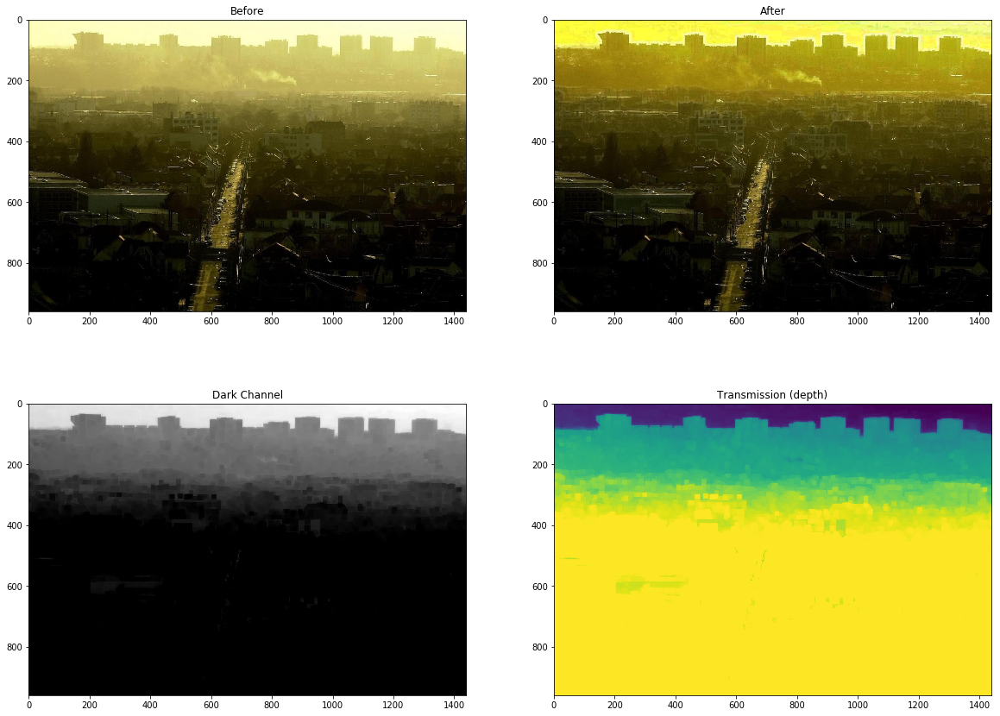

In [10]:
%%time
img8 = Haze2remove("8.jpg")
img8.go()
img8.show()

CPU times: user 7.75 s, sys: 235 ms, total: 7.98 s
Wall time: 6.84 s


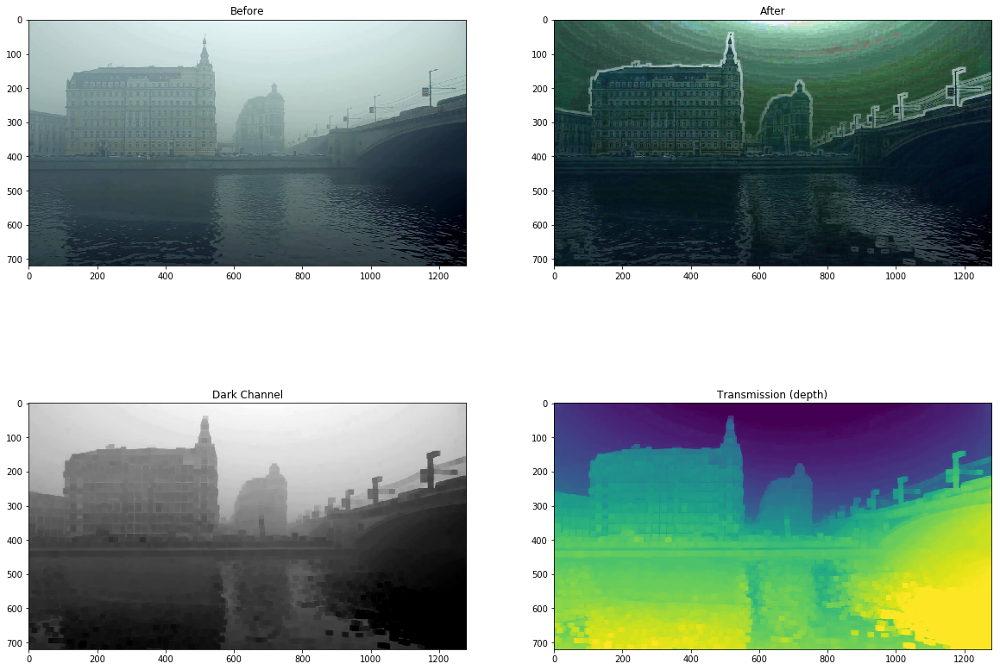

In [11]:
%%time
img9 = Haze2remove("9.jpg")
img9.go()
img9.show()

CPU times: user 3.38 s, sys: 126 ms, total: 3.51 s
Wall time: 2.6 s


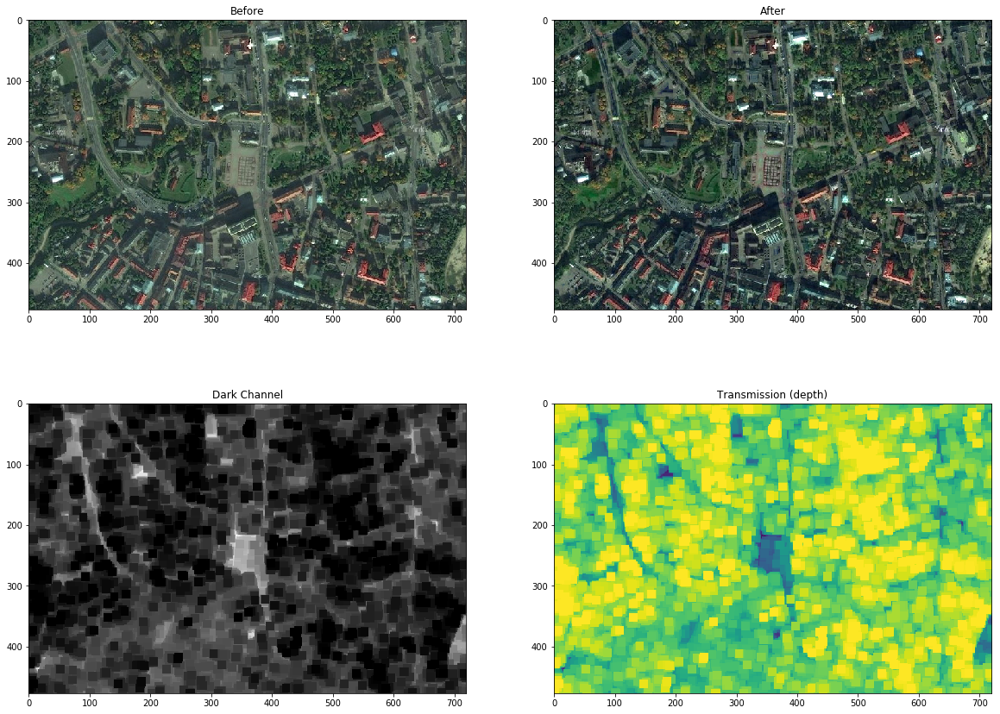

In [12]:
%%time
img10 = Haze2remove("10.jpg")
img10.go()
img10.show()

CPU times: user 3.92 s, sys: 78.5 ms, total: 3.99 s
Wall time: 3.15 s


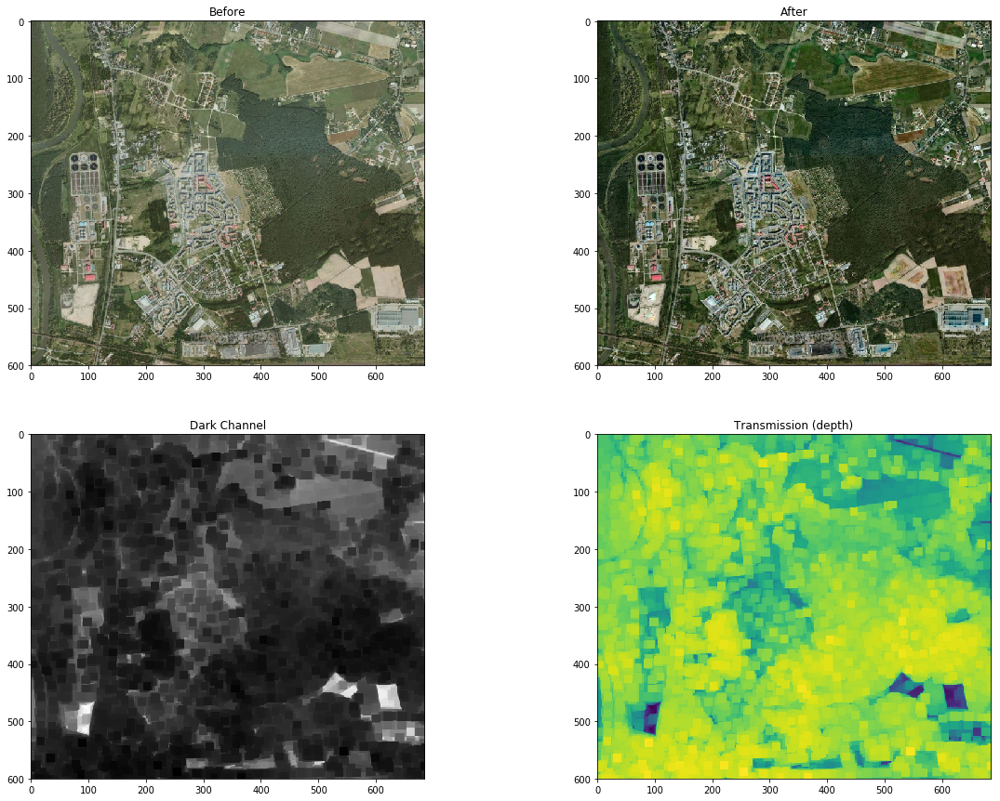

In [13]:
%%time
img11 = Haze2remove("11.jpg")
img11.go()
img11.show()

CPU times: user 2.84 s, sys: 94.2 ms, total: 2.94 s
Wall time: 2.08 s


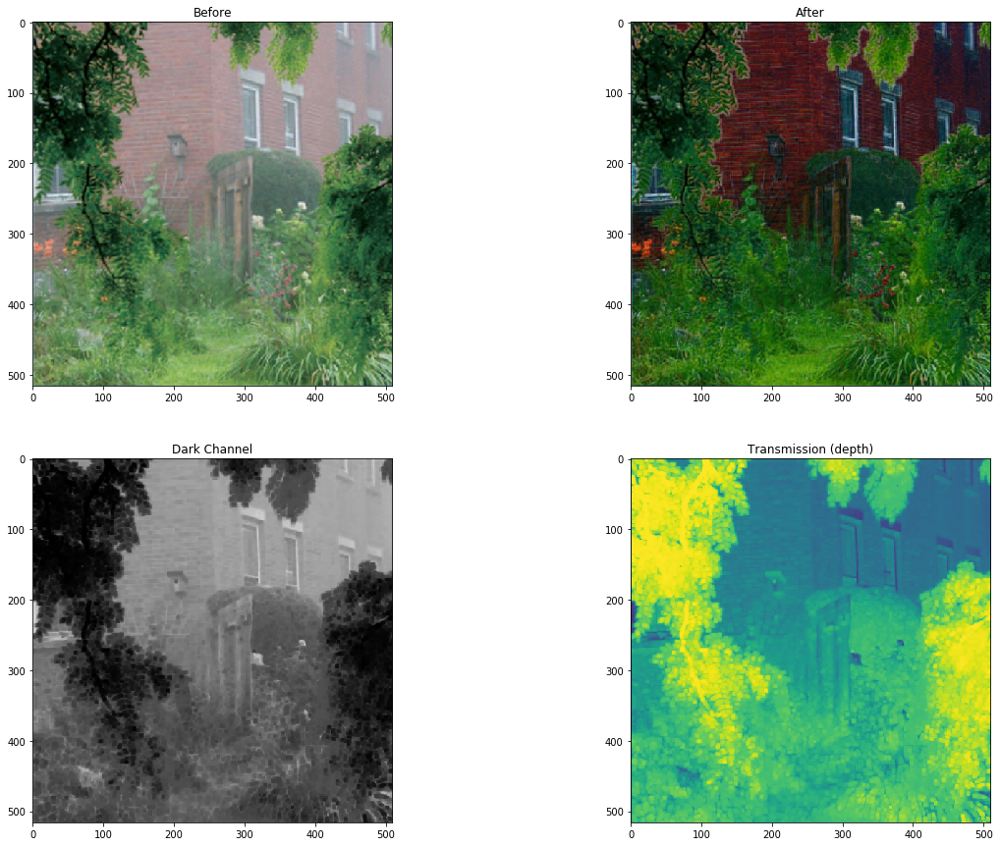

In [14]:
%%time
img13 = Haze2remove("12.jpg", patch = 5)
img13.go()
img13.show()

CPU times: user 6.48 s, sys: 367 ms, total: 6.84 s
Wall time: 5.52 s


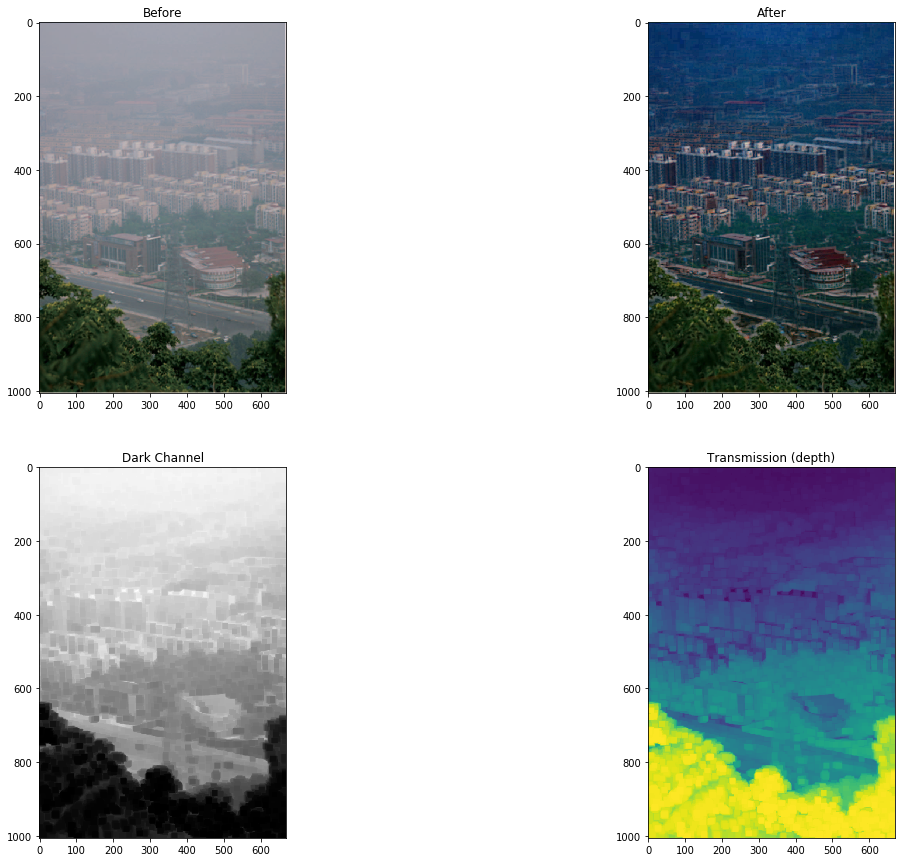

In [15]:
%%time
img14 = Haze2remove("13.jpg", patch= 15)
img14.go()
img14.show()

CPU times: user 6.53 s, sys: 186 ms, total: 6.72 s
Wall time: 5.57 s


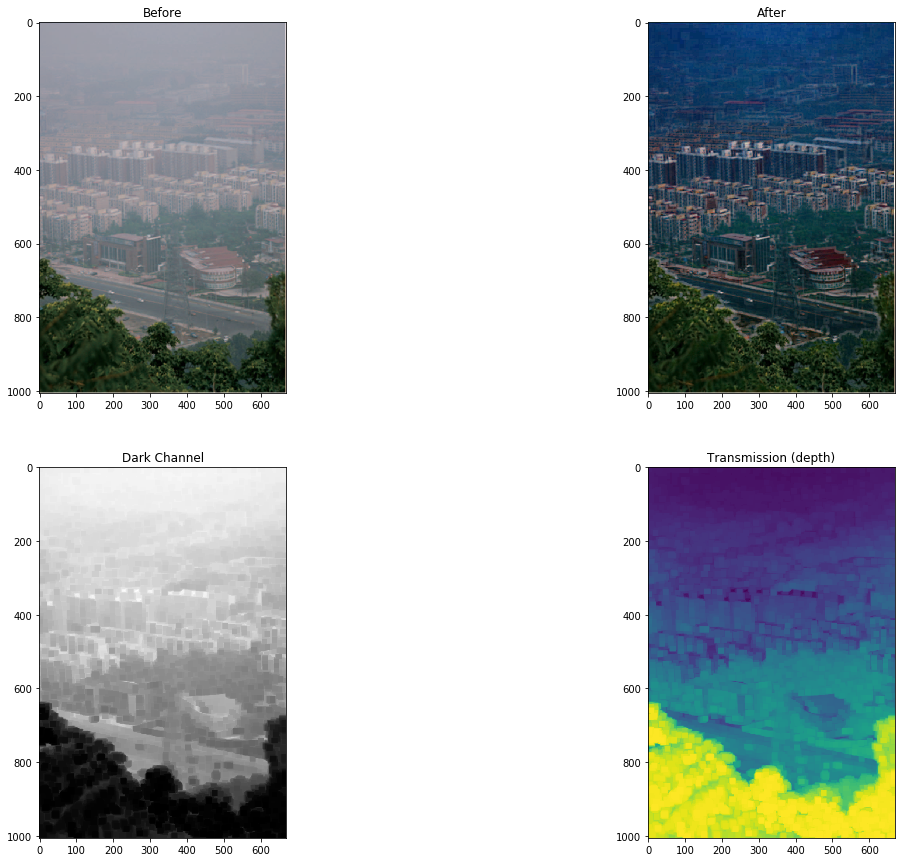

In [16]:
%%time
img14 = Haze2remove("13.jpg", patch= 15)
img14.go()
img14.show()

CPU times: user 10.5 s, sys: 333 ms, total: 10.8 s
Wall time: 9.5 s


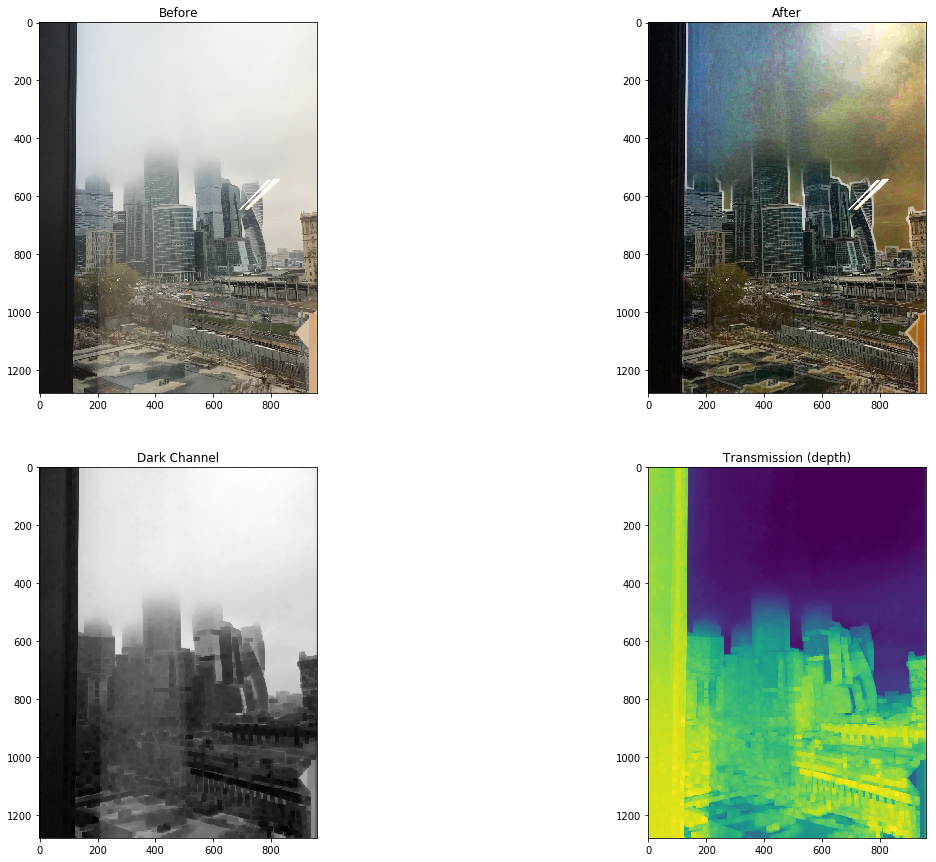

In [17]:
%%time
img15= Haze2remove("14.jpg", patch= 15)
img15.go()
img15.show()

CPU times: user 8.71 s, sys: 193 ms, total: 8.9 s
Wall time: 7.71 s


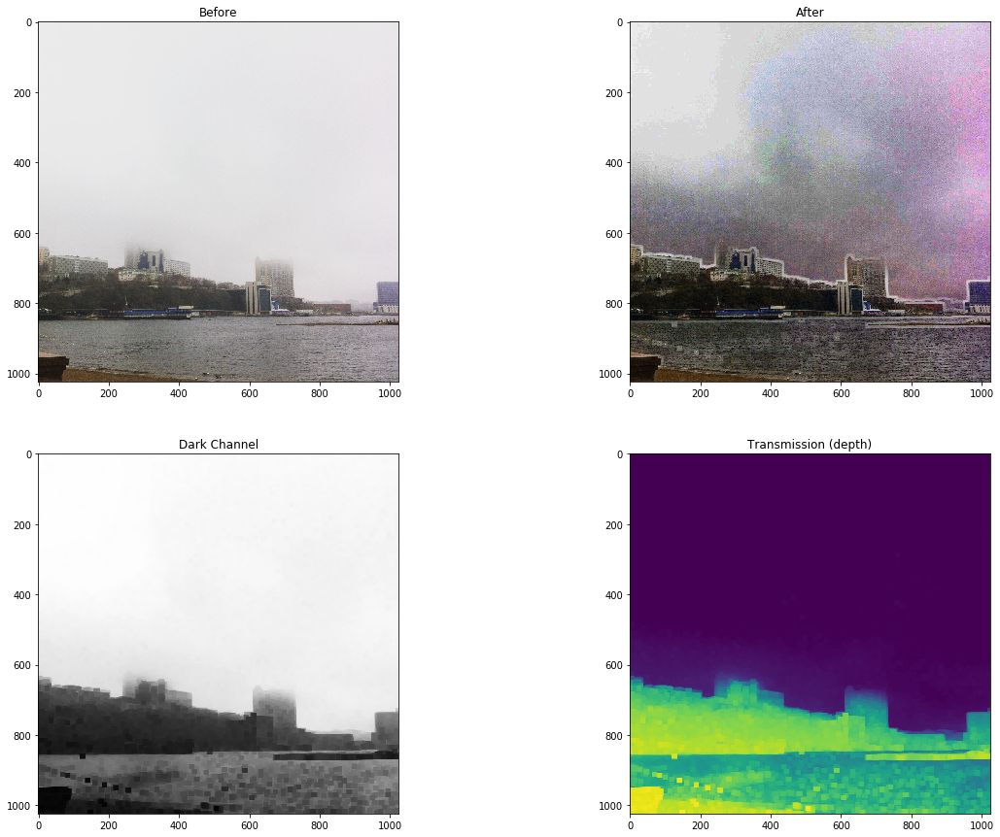

In [18]:
%%time
img16= Haze2remove("15.jpg", patch= 15)
img16.go()
img16.show()

CPU times: user 9.11 s, sys: 286 ms, total: 9.39 s
Wall time: 8.12 s


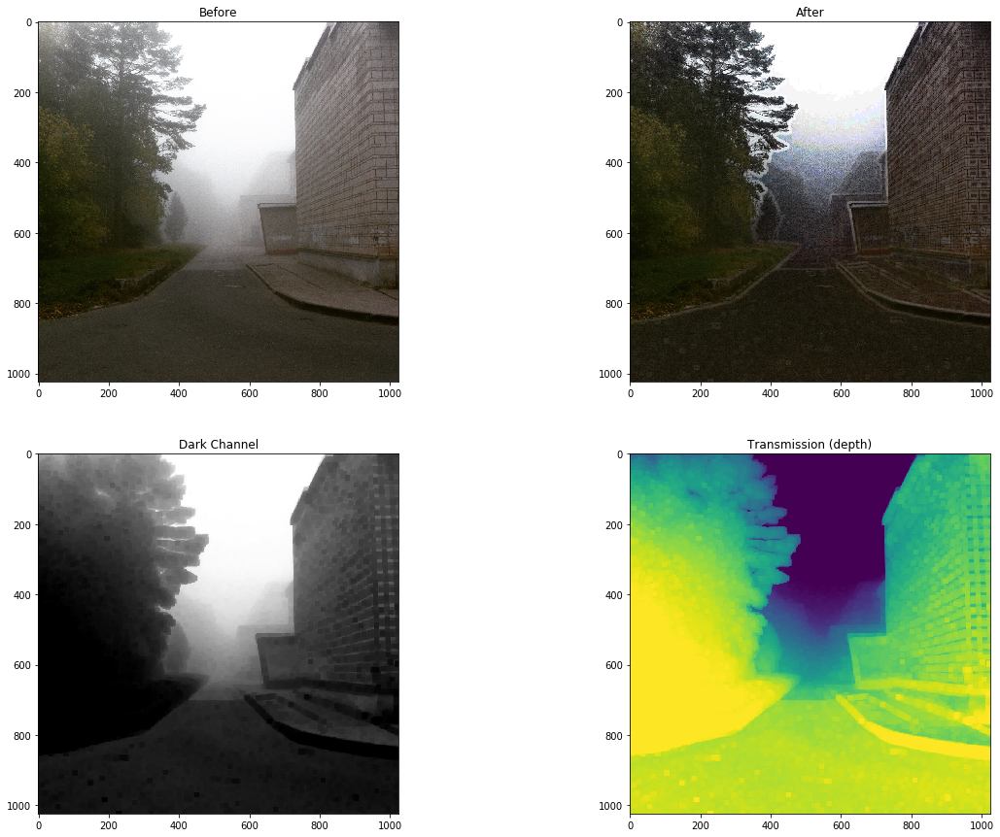

In [19]:
%%time
img17= Haze2remove("16.jpg", patch= 15)
img17.go()
img17.show()

CPU times: user 19.1 s, sys: 830 ms, total: 19.9 s
Wall time: 17.8 s


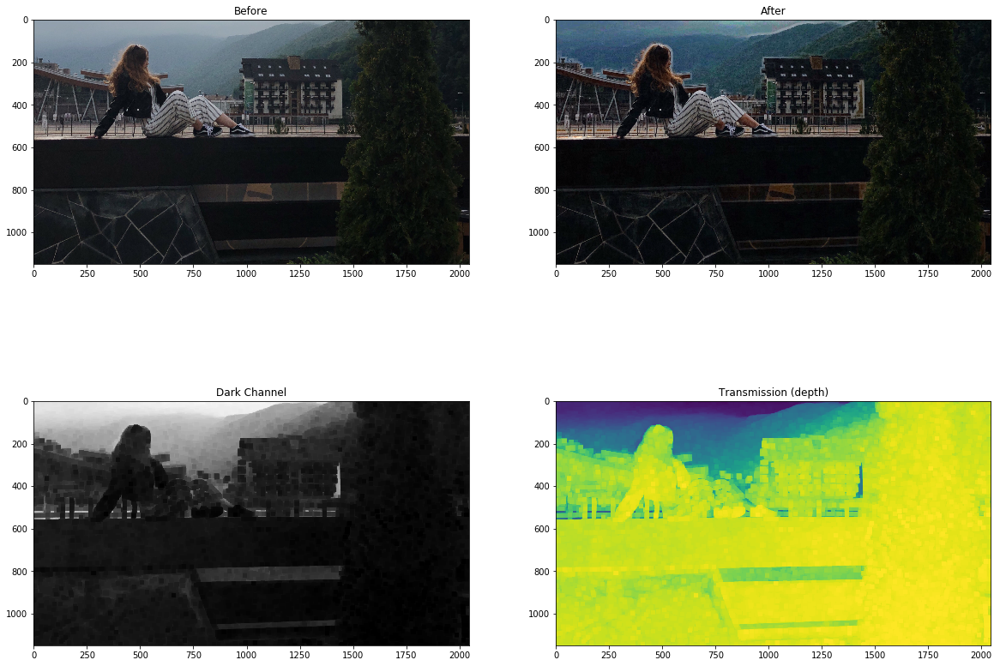

In [20]:
%%time
img20= Haze2remove("ali.jpg", patch= 21, omega= 0.9, percent=0.1)
img20.go()
img20.show()

CPU times: user 16.6 s, sys: 601 ms, total: 17.2 s
Wall time: 15.4 s


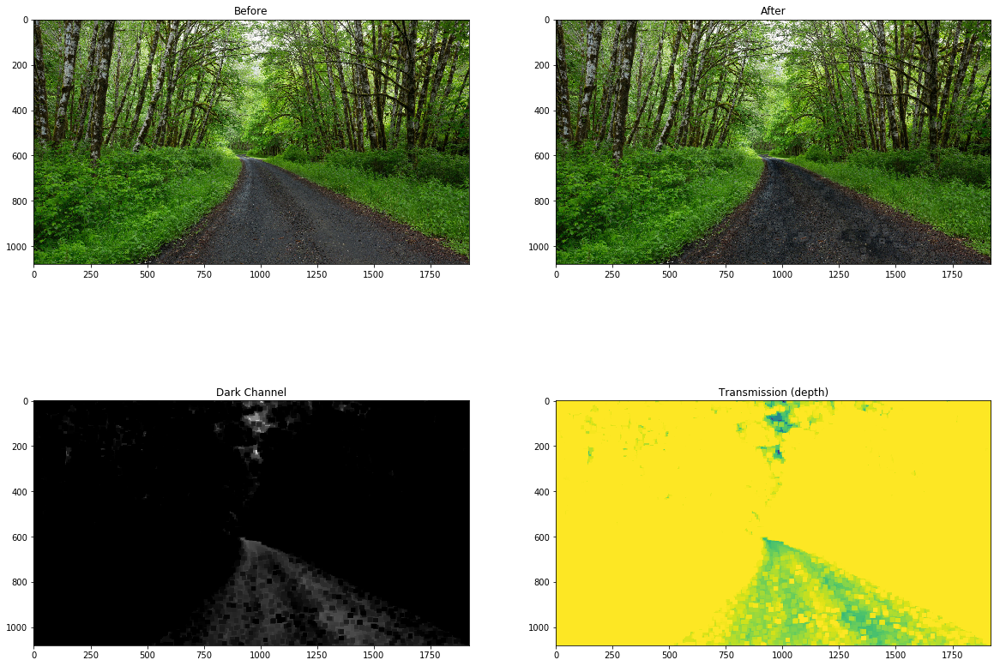

In [21]:
%%time
img21= Haze2remove("for.jpg", patch= 21, percent=0.1)
img21.go()
img21.show()

CPU times: user 10.7 s, sys: 558 ms, total: 11.2 s
Wall time: 9.52 s


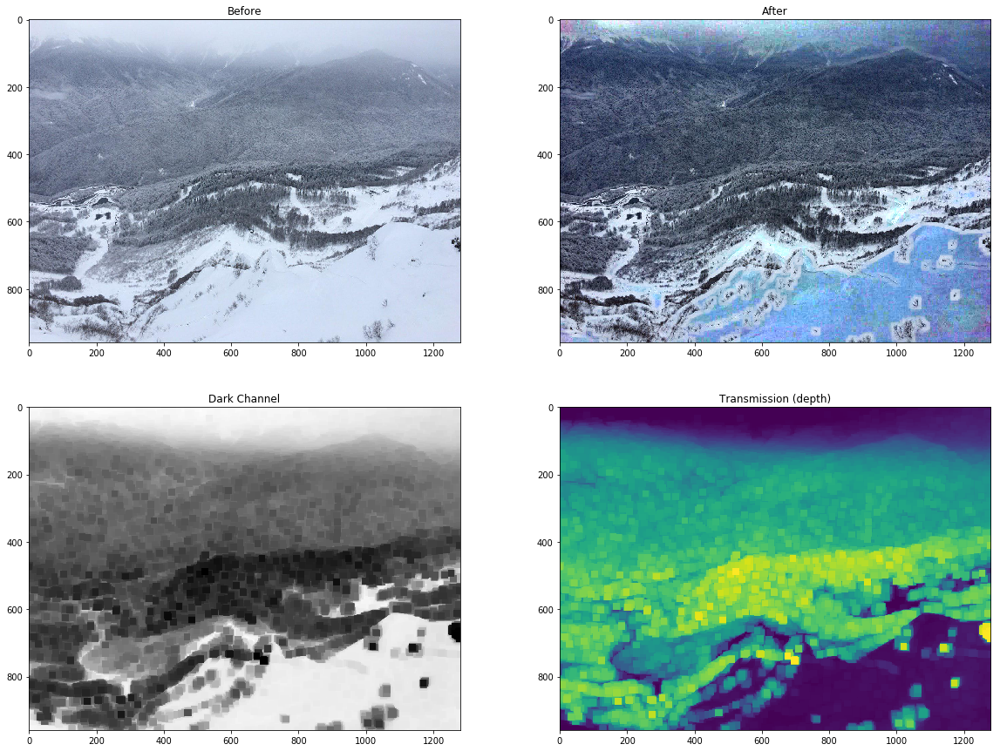

In [22]:
%%time
img21= Haze2remove("снег.jpg", patch= 21, percent=0.1)
img21.go()
img21.show()

CPU times: user 32.9 s, sys: 1.53 s, total: 34.4 s
Wall time: 31.2 s


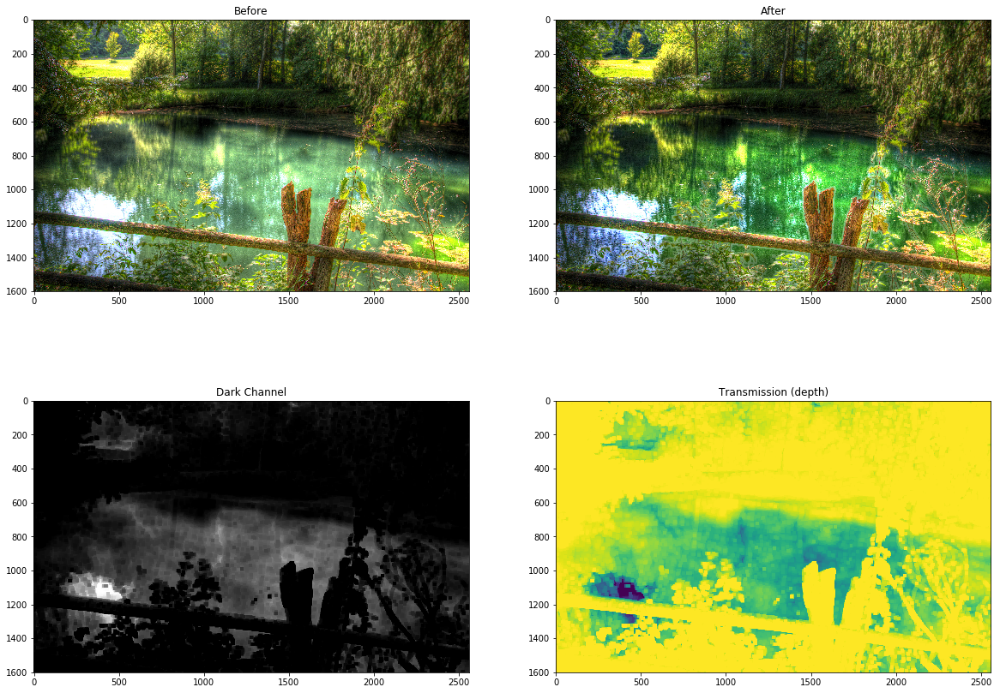

In [23]:
%%time
img21= Haze2remove("озеро.jpg", patch= 21, percent=0.1)
img21.go()
img21.show()

CPU times: user 5.19 s, sys: 316 ms, total: 5.51 s
Wall time: 4.34 s


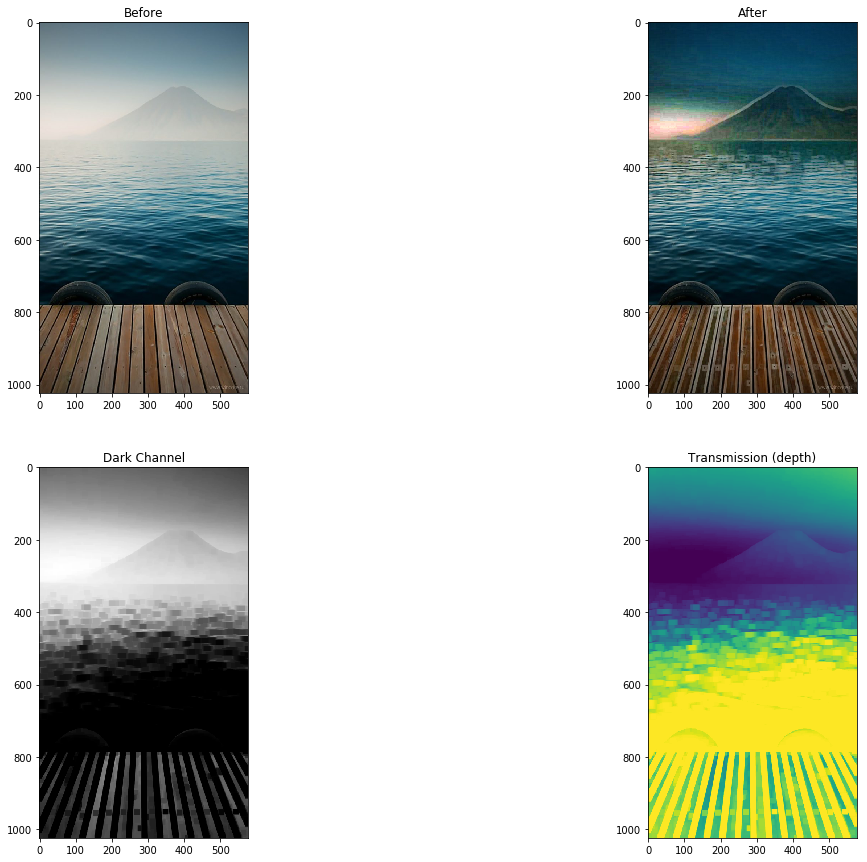

In [24]:
%%time
img21= Haze2remove("111.jpg", patch= 15, percent=0.1)
img21.go()
img21.show()

CPU times: user 29.2 s, sys: 1.11 s, total: 30.3 s
Wall time: 27.4 s


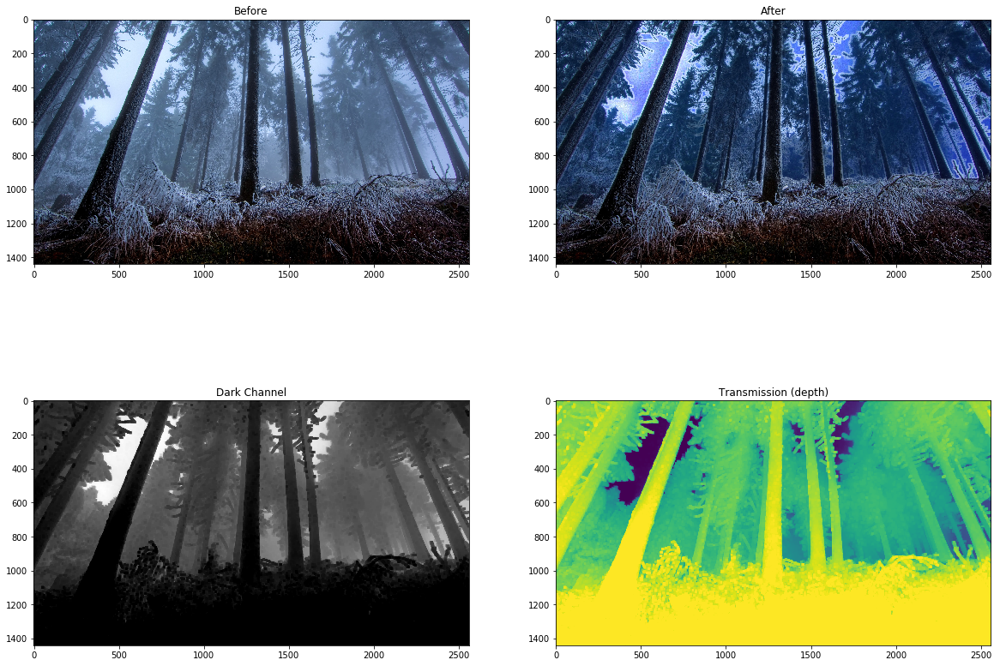

In [25]:
%%time
img21= Haze2remove("les.jpg", patch= 15, percent=0.001)
img21.go()
img21.show()